In [51]:
import pandas as pd
import datetime
import pandas_datareader.data as web
from pandas import Series, DataFrame
import scipy

In [3]:
start = datetime.datetime(2010, 1, 1)
end = datetime.datetime(2020, 8, 21)
df = web.DataReader("AAPL", 'yahoo', start, end)

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-08-17,464.350006,455.850006,464.250000,458.429993,29890400.0,458.429993
2020-08-18,464.000000,456.029999,457.410004,462.250000,26408400.0,462.250000
2020-08-19,468.649994,462.440002,463.929993,462.829987,36384500.0,462.829987
2020-08-20,473.570007,462.929993,463.000000,473.100006,31565000.0,473.100006
2020-08-21,499.471985,477.000000,477.049988,497.480011,81892259.0,497.480011


In [4]:
close_px = df['Adj Close']
mavg = close_px.rolling(window=100).mean()

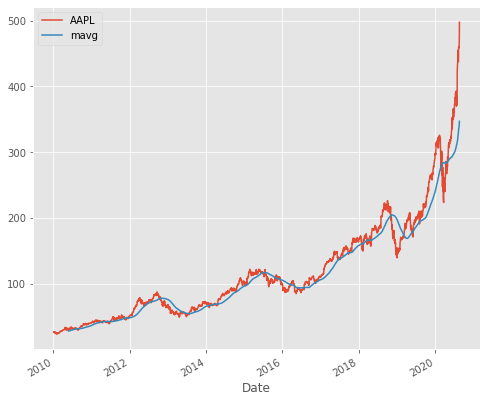

In [33]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import style

# Adjusting the size of matplotlib
import matplotlib as mpl
mpl.rc('figure', figsize=(8, 7))
mpl.__version__

# Adjusting the style of matplotlib
style.use('ggplot')

close_px.plot(label='AAPL')
mavg.plot(label='mavg')
plt.legend()

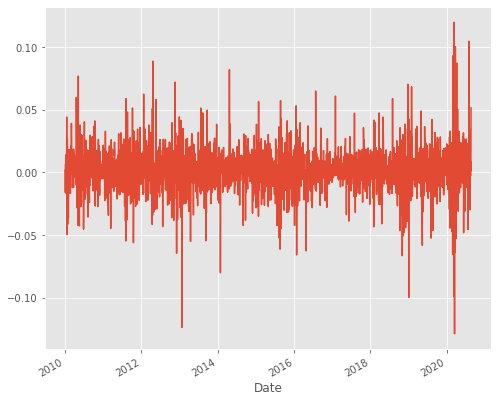

In [34]:
rets = close_px / close_px.shift(1) - 1
rets.plot(label='return')

In [37]:
rets.agg(['min', 'max'])

min   -0.128647
max    0.119808
Name: Adj Close, dtype: float64

In [38]:
dfcomp = web.DataReader(['AAPL', 'GE', 'GOOG', 'IBM', 'MSFT'],'yahoo',start=start,end=end)['Adj Close']

In [39]:
dfcomp

Symbols,AAPL,GE,GOOG,IBM,MSFT
Date,,,,,
2010-01-04,26.419203,10.858186,312.204773,93.500313,24.168472
2010-01-05,26.464878,10.914412,310.829926,92.370834,24.176279
2010-01-06,26.043921,10.858186,302.994293,91.770790,24.027906
2010-01-07,25.995777,11.420421,295.940735,91.453102,23.778025
2010-01-08,26.168606,11.666402,299.885956,92.370834,23.942017
...,...,...,...,...,...
2020-08-17,458.429993,6.470000,1517.979980,124.440002,209.772919
2020-08-18,462.250000,6.440000,1558.599976,124.919998,210.979996
2020-08-19,462.829987,6.380000,1547.530029,123.839996,209.699997


In [40]:
retscomp = dfcomp.pct_change()
corr = retscomp.corr()

In [41]:
retscomp

Symbols,AAPL,GE,GOOG,IBM,MSFT
Date,,,,,
2010-01-04,NaN,NaN,NaN,NaN,NaN
2010-01-05,0.001729,0.005178,-0.004404,-0.012080,0.000323
2010-01-06,-0.015906,-0.005152,-0.025209,-0.006496,-0.006137
2010-01-07,-0.001849,0.051780,-0.023280,-0.003462,-0.010400
2010-01-08,0.006648,0.021539,0.013331,0.010035,0.006897
...,...,...,...,...,...
2020-08-17,-0.002611,-0.028529,0.006798,-0.006626,0.006606
2020-08-18,0.008333,-0.004637,0.026759,0.003857,0.005754
2020-08-19,0.001255,-0.009317,-0.007102,-0.008646,-0.006067


In [43]:
corr

Symbols,AAPL,GE,GOOG,IBM,MSFT
Symbols,,,,,
AAPL,1.000000,0.374186,0.525784,0.457045,0.547123
GE,0.374186,1.000000,0.375922,0.515059,0.409602
GOOG,0.525784,0.375922,1.000000,0.471207,0.603895
IBM,0.457045,0.515059,0.471207,1.000000,0.549694
MSFT,0.547123,0.409602,0.603895,0.549694,1.000000


Text(0, 0.5, 'Returns GE')

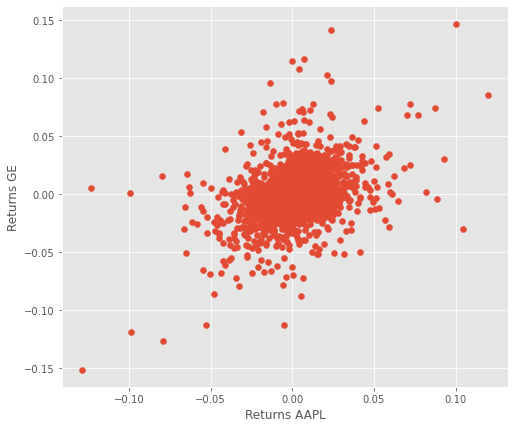

In [46]:
plt.scatter(retscomp.AAPL, retscomp.GE)
plt.xlabel('Returns AAPL')
plt.ylabel('Returns GE')

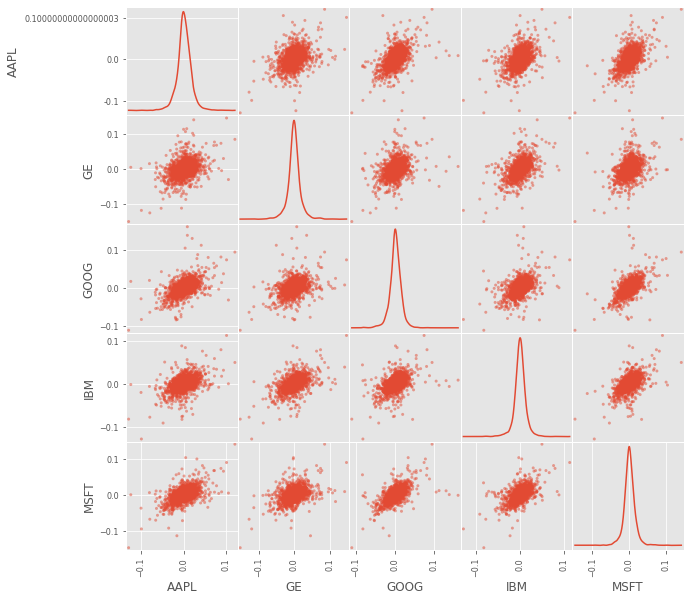

In [53]:
pd.plotting.scatter_matrix(retscomp, diagonal='kde', figsize=(10, 10));

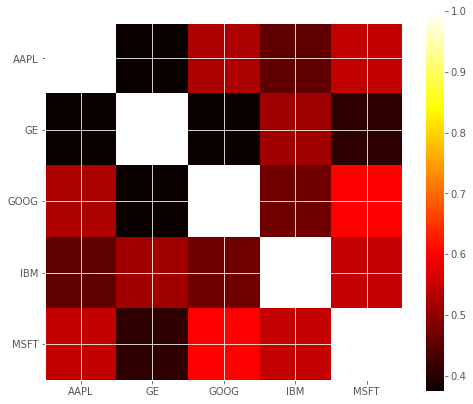

In [54]:
plt.imshow(corr, cmap='hot', interpolation='none')
plt.colorbar()
plt.xticks(range(len(corr)), corr.columns)
plt.yticks(range(len(corr)), corr.columns);

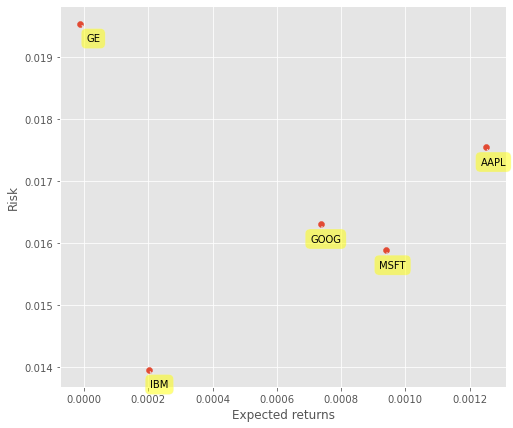

In [55]:
plt.scatter(retscomp.mean(), retscomp.std())
plt.xlabel('Expected returns')
plt.ylabel('Risk')
for label, x, y in zip(retscomp.columns, retscomp.mean(), retscomp.std()):
    plt.annotate(
        label, 
        xy = (x, y), xytext = (20, -20),
        textcoords = 'offset points', ha = 'right', va = 'bottom',
        bbox = dict(boxstyle = 'round,pad=0.5', fc = 'yellow', alpha = 0.5),
        arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3,rad=0'))